In [2]:
# Install Ultralytics library
%pip install ultralytics

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import yaml
from PIL import Image
from collections import deque
from ultralytics import YOLO
from IPython.display import Video

In [4]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#ffe4de'}, style='darkgrid')

In [5]:
# Load the pre-trained YOLOv8 nano segmentation model
model = YOLO('yolov8n-seg.pt') 

In [6]:
# Define the dataset_path
dataset_path = r"C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\Pothole_Segmentation_YOLOv8"
# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Pothole
nc: 1
roboflow:
  license: CC BY 4.0
  project: pothole_segmentation_yolov8
  url: https://universe.roboflow.com/farzad/pothole_segmentation_yolov8/dataset/1
  version: 1
  workspace: farzad
train: ../train/images
val: ../valid/images



In [7]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):  
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'): 
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 720
Number of validation images: 60
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


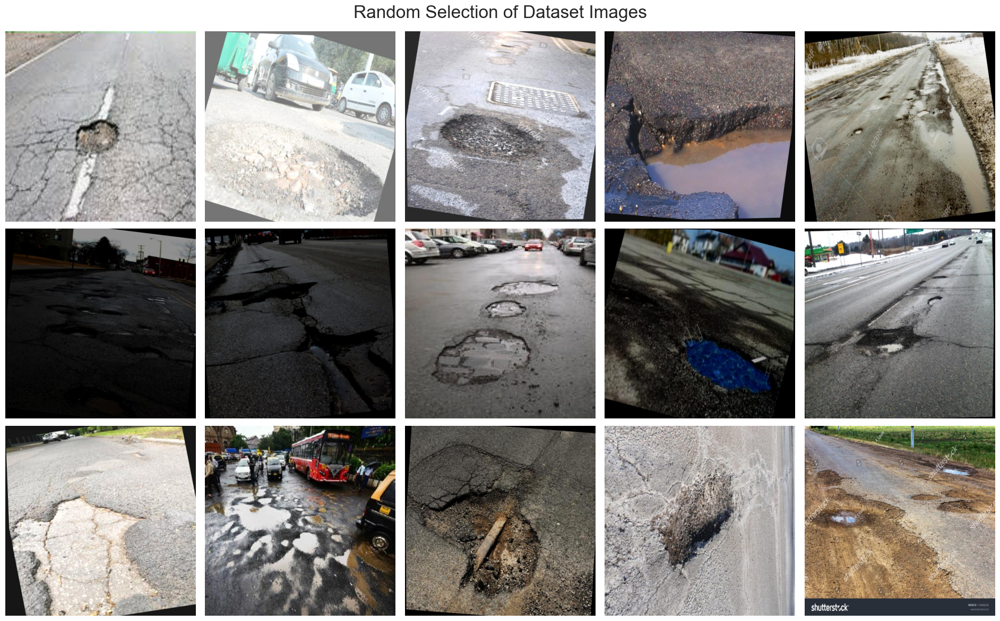

In [8]:
# Set the seed for the random number generator
random.seed(0)

# Create a list of image files
image_files = [f for f in os.listdir(train_images_path) if f.endswith('.jpg')]

# Randomly select 15 images
random_images = random.sample(image_files, 15)

# Create a new figure
plt.figure(figsize=(19, 12))

# Loop through each image and display it in a 3x5 grid
for i, image_file in enumerate(random_images):
    image_path = os.path.join(train_images_path, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')

# Add a suptitle
plt.suptitle('Random Selection of Dataset Images', fontsize=24)

# Show the plot
plt.tight_layout()
plt.show()

# Deleting unnecessary variable to free up memory
del image_files

In [9]:
# Train the model on our custom dataset
results = model.train(
    data=yaml_file_path,     # Path to the dataset configuration file
    epochs=150,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    patience=15,             # Epochs to wait for no observable improvement for early stopping of training
    batch=16,                # Number of images per batch
    optimizer='auto',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.0001,              # Initial learning rate 
    lrf=0.01,                # Final learning rate (lr0 * lrf)
    dropout=0.25,            # Use dropout regularization
    device=0,                # Device to run on, i.e. cuda device=0 
    seed=42                  # Random seed for reproducibility
)

Ultralytics 8.4.17  Python-3.12.0 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\Pothole_Segmentation_YOLOv8\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.25, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train7, nbs=64, nms=False, ops

In [10]:
post_training_files_path = r"C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\runs\segment\train5"

!dir "{post_training_files_path}"

 Volume in drive C is OS
 Volume Serial Number is D6F7-DD93

 Directory of C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\runs\segment\train5

26-02-2026  19:20    <DIR>          .
26-02-2026  20:11    <DIR>          ..
26-02-2026  18:55             1,793 args.yaml
26-02-2026  19:20           106,300 BoxF1_curve.png
26-02-2026  19:20            90,978 BoxPR_curve.png
26-02-2026  19:20           108,962 BoxP_curve.png
26-02-2026  19:20           104,769 BoxR_curve.png
26-02-2026  19:20            93,527 confusion_matrix.png
26-02-2026  19:20            94,080 confusion_matrix_normalized.png
26-02-2026  18:56           199,593 labels.jpg
26-02-2026  19:20           106,741 MaskF1_curve.png
26-02-2026  19:20            92,544 MaskPR_curve.png
26-02-2026  19:20           109,233 MaskP_curve.png
26-02-2026  19:20           105,148 MaskR_curve.png
26-02-2026  19:20             8,218 results.csv
26-02-2026  19:20           457,605 results.png
26-02-2026  18:57           654,426 train_batch0

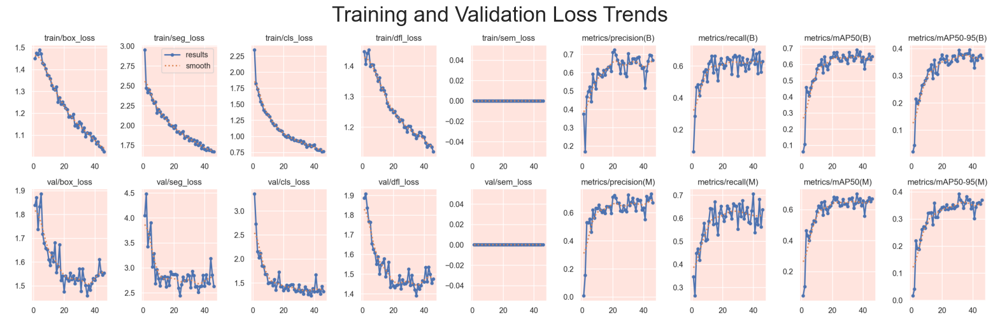

In [11]:
# Create the full file path by joining the directory path with the filename
results_file_path = os.path.join(post_training_files_path, r'C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\runs\segment\train5\results.png')

# Read the image using cv2
image = cv2.imread(results_file_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  

# Display the image using matplotlib
plt.figure(figsize=(20, 8))
plt.imshow(image)
plt.title('Training and Validation Loss Trends', fontsize=24)
plt.axis('off') 
plt.show()

In [12]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title, ylim_range=[0,2]):
    plt.figure(figsize=(12, 4))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='blue', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='#ed2f00', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.ylim(ylim_range)
    plt.legend()
    plt.show()

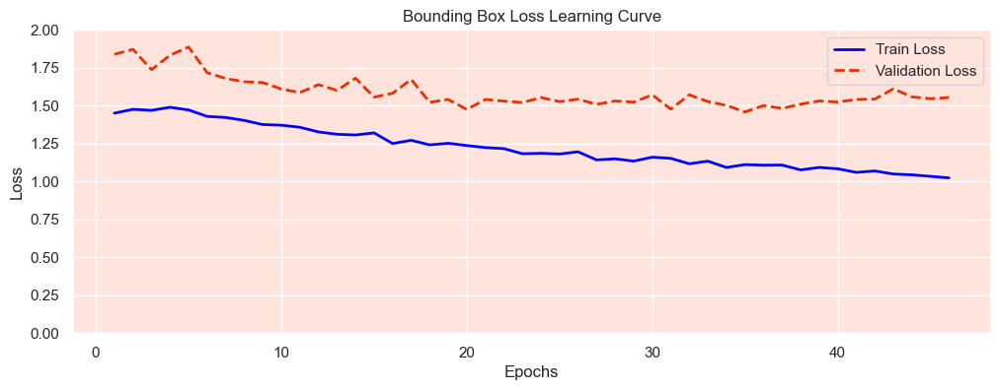

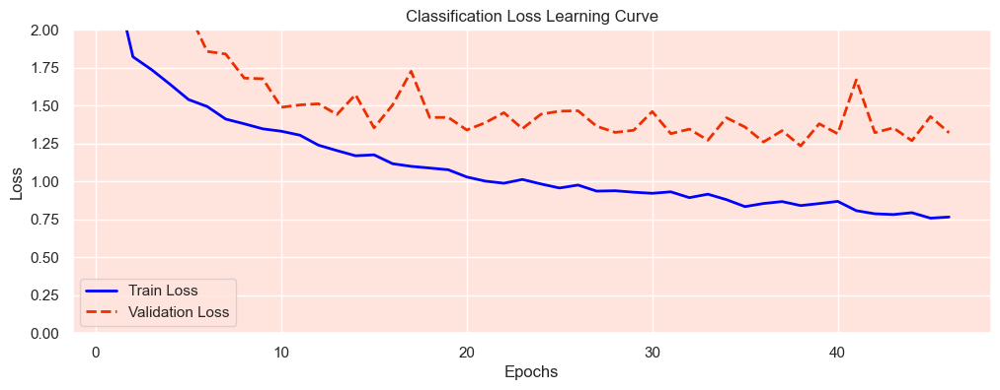

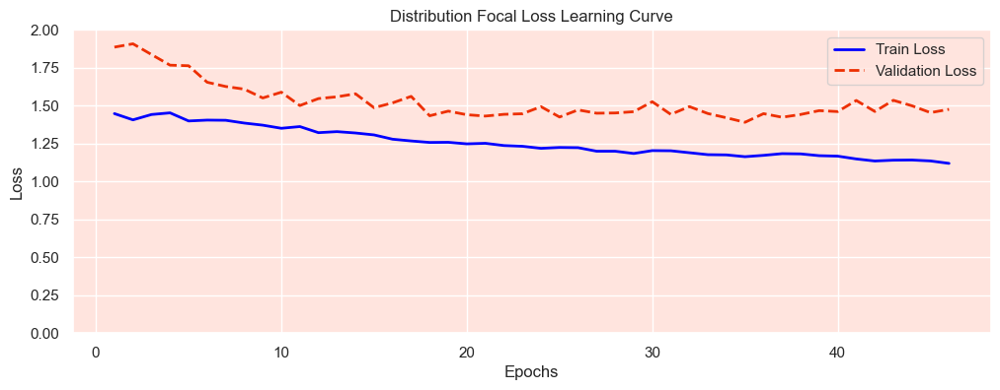

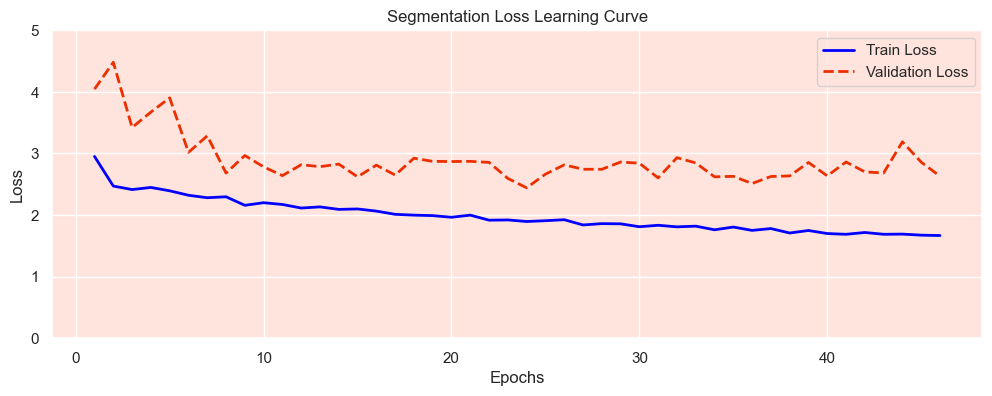

In [13]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_training_files_path, r"C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\runs\segment\train5\results.csv")

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Bounding Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')
plot_learning_curve(df, 'train/seg_loss', 'val/seg_loss', 'Segmentation Loss Learning Curve', ylim_range=[0,5])

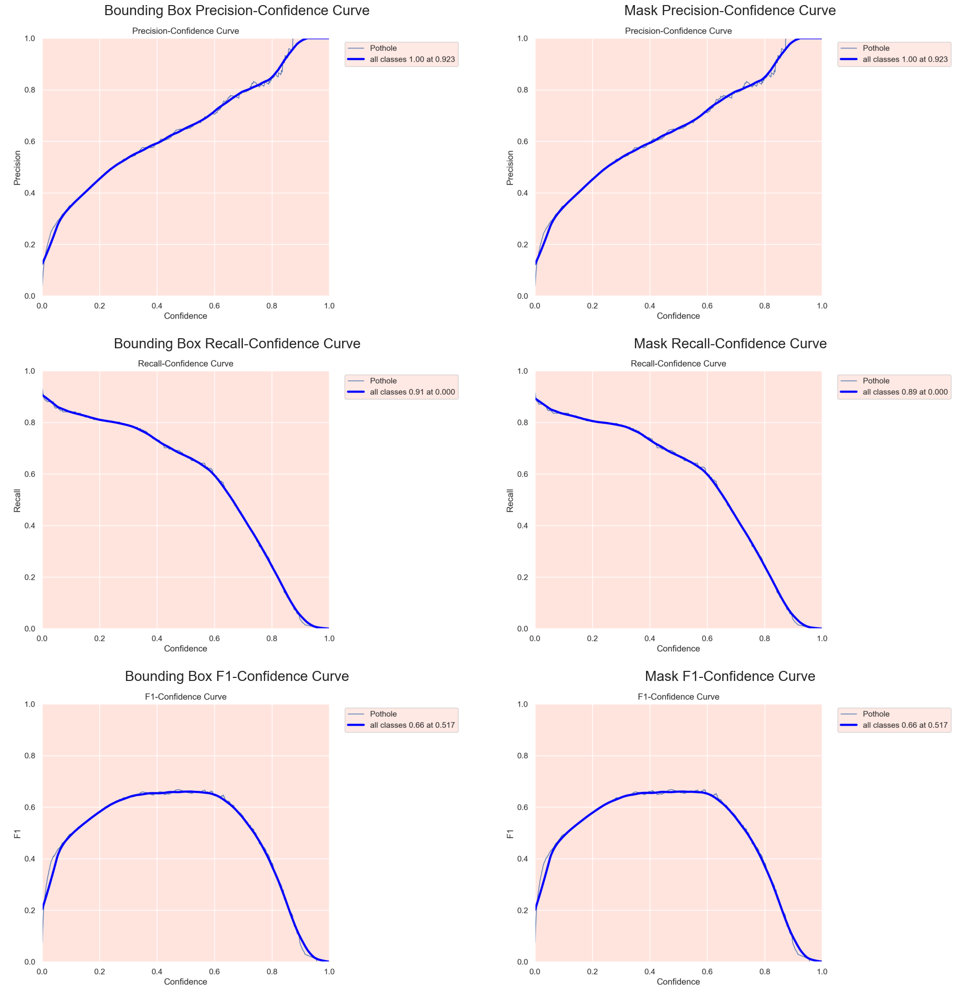

In [14]:
# Define the filenames for 'Box' and 'Mask' metrics along with their titles
box_files_titles = {
    'BoxP_curve.png': 'Bounding Box Precision-Confidence Curve',
    'BoxR_curve.png': 'Bounding Box Recall-Confidence Curve',
    'BoxF1_curve.png': 'Bounding Box F1-Confidence Curve'
}
mask_files_titles = {
    'MaskP_curve.png': 'Mask Precision-Confidence Curve',
    'MaskR_curve.png': 'Mask Recall-Confidence Curve',
    'MaskF1_curve.png': 'Mask F1-Confidence Curve'
}

# Create a 3x2 subplot
fig, axs = plt.subplots(3, 2, figsize=(20, 20))

# Function to read and convert image for plotting
def read_and_convert_image(file_path):
    # Read the image using cv2
    image = cv2.imread(file_path)
    # Convert from BGR to RGB
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Plot 'Box' images in the first column with meaningful titles
for i, (filename, title) in enumerate(box_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i, 0].imshow(img)
    axs[i, 0].set_title(title, fontsize=20)
    axs[i, 0].axis('off') 

# Plot 'Mask' images in the second column with meaningful titles
for i, (filename, title) in enumerate(mask_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i, 1].imshow(img)
    axs[i, 1].set_title(title, fontsize=20)
    axs[i, 1].axis('off')  

plt.tight_layout()
plt.show()

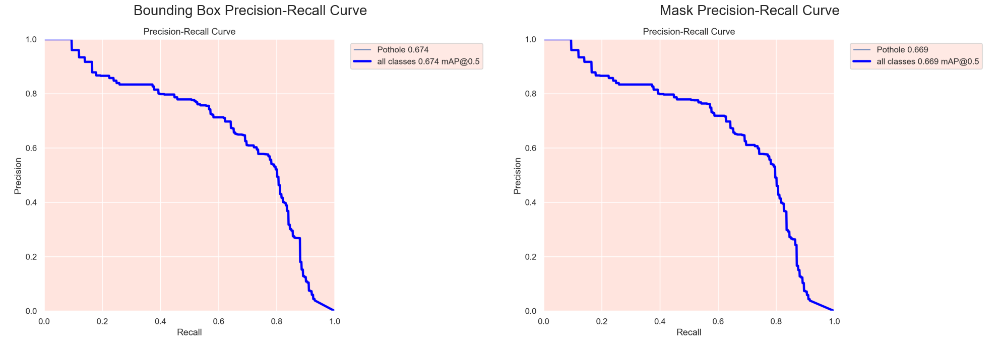

In [15]:
# Define the filenames for 'Box' and 'Mask' metrics along with their titles
pr_files_titles = {
    'BoxPR_curve.png': 'Bounding Box Precision-Recall Curve',
    'MaskPR_curve.png': 'Mask Precision-Recall Curve'
}

# Create a 1x2 subplot
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Plot 'Box' and 'Mask' images in the subplot with meaningful titles
for i, (filename, title) in enumerate(pr_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i].imshow(img)
    axs[i].set_title(title, fontsize=20)
    axs[i].axis('off')

plt.tight_layout()
plt.show()

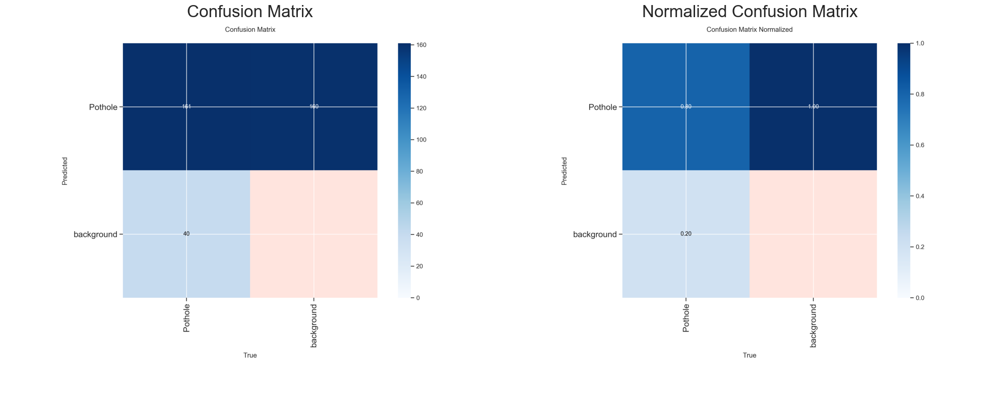

In [16]:
# Construct the path to the confusion matrix images
confusion_matrix_path = os.path.join(post_training_files_path, r"C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\runs\segment\train5\confusion_matrix.png")
confusion_matrix_normalized_path = os.path.join(post_training_files_path, r"C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\runs\segment\train5\confusion_matrix_normalized.png")

# Create a 1x2 subplot
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Read and convert both images
cm_img = read_and_convert_image(confusion_matrix_path)
cm_norm_img = read_and_convert_image(confusion_matrix_normalized_path)

# Display the images
axs[0].imshow(cm_img)
axs[0].set_title('Confusion Matrix', fontsize=24)
axs[0].axis('off') 

axs[1].imshow(cm_norm_img)
axs[1].set_title('Normalized Confusion Matrix', fontsize=24)
axs[1].axis('off')

plt.tight_layout()
plt.show()

In [17]:
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.4.17  Python-3.12.0 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLOv8n-seg summary (fused): 86 layers, 3,258,259 parameters, 0 gradients, 11.3 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 821.2267.8 MB/s, size: 81.3 KB)
val: Scanning C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\Pothole_Segmentation_YOLOv8\valid\labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 60/60  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.1s/it 4.4s1.5ss
                   all         60        201      0.653      0.662      0.674      0.396      0.653      0.662       0.67      0.392
Speed: 5.4ms preprocess, 14.1ms inference, 0.0ms loss, 6.3ms postprocess per image
Results saved to C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\runs\segment\val3


In [18]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df.round(3)

,Metric Value
metrics/precision(B),0.653
metrics/recall(B),0.662
metrics/mAP50(B),0.674
metrics/mAP50-95(B),0.396
metrics/precision(M),0.653
metrics/recall(M),0.662
metrics/mAP50(M),0.670
metrics/mAP50-95(M),0.392
fitness,0.789



image 1/1 C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\Pothole_Segmentation_YOLOv8\valid\images\pic-114-_jpg.rf.a0f30e06b3b96d7879d5f55a7012433c.jpg: 640x640 (no detections), 14.6ms
Speed: 3.9ms preprocess, 14.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\Pothole_Segmentation_YOLOv8\valid\images\pic-144-_jpg.rf.61a3b886f058ed3a4788426cfa7c4988.jpg: 640x640 1 Pothole, 8.6ms
Speed: 2.6ms preprocess, 8.6ms inference, 26.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\Pothole_Segmentation_YOLOv8\valid\images\pic-165-_jpg.rf.82b3db37518b15aa73be6e4093deaf46.jpg: 640x640 1 Pothole, 11.6ms
Speed: 2.5ms preprocess, 11.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\Pothole_Segmentation_YOLOv8\valid\images\pic-184-_jpg.rf.cb753b5f714073fc4a8c2de602386399.jpg: 640x64

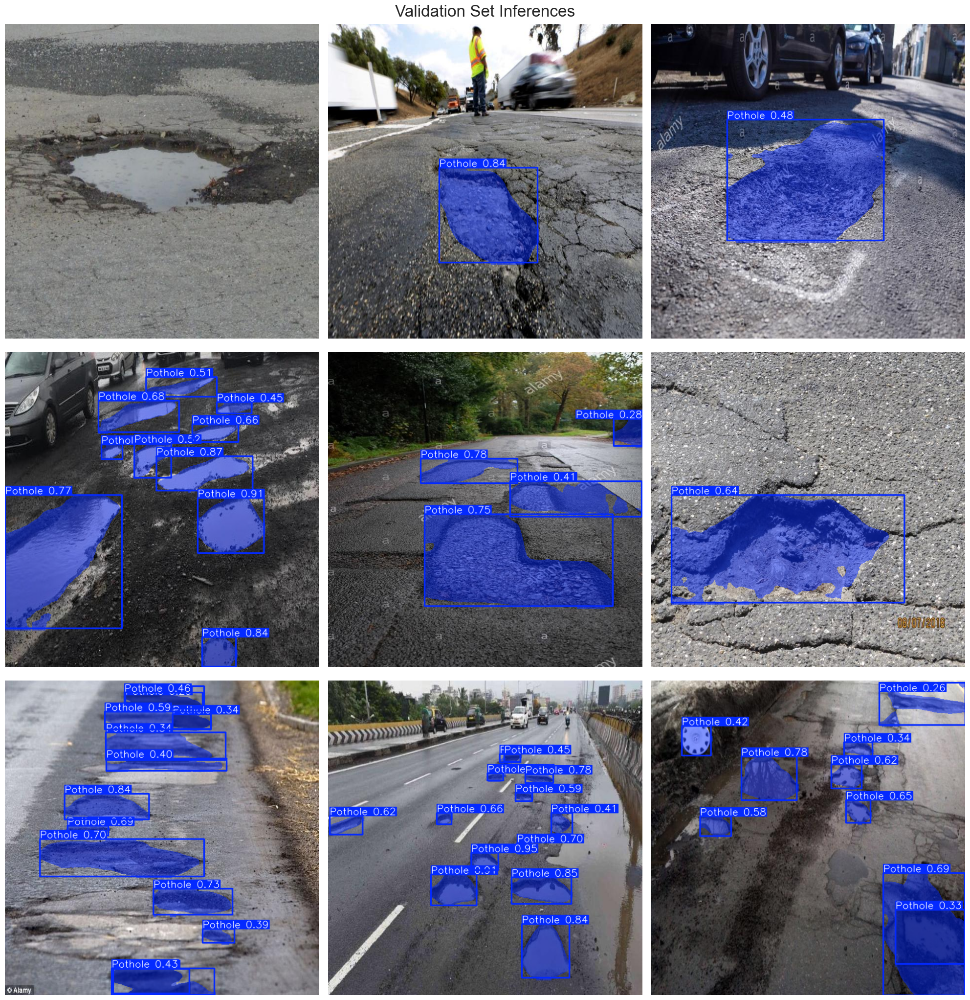

In [19]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640)
    annotated_image = results[0].plot()
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [24]:
import os
import shutil

# Source video (file)
dataset_video_path = r"C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\Pothole_Segmentation_YOLOv8\sample_video.mp4"

# Destination directory
working_dir = r"C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\working"

# Ensure destination directory exists
os.makedirs(working_dir, exist_ok=True)

# Destination file path (IMPORTANT FIX)
video_path = os.path.join(working_dir, "sample_video.mp4")

# Copy file
shutil.copyfile(dataset_video_path, video_path)

print("✅ Video copied to:", video_path)

# YOLO inference
best_model.predict(source=video_path, save=True)

✅ Video copied to: C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\working\sample_video.mp4

WARNING 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/375) C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\working\sample_video.mp4: 384x640 4 Potholes, 84.8ms
video 1/1 (frame 2/375) C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\working\sample_video.mp4: 384x640 3 Potholes, 14.7ms
video 1/1 (frame 3/375) C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\working\sample_video.mp4: 384x640 5 Pothole

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'Pothole'}
 obb: None
 orig_img: array([[[146, 137, 129],
         [177, 168, 160],
         [178, 169, 161],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[197, 188, 180],
         [206, 197, 189],
         [164, 155, 147],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[150, 141, 133],
         [183, 174, 166],
         [188, 179, 171],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        ...,
 
        [[ 80,  92, 102],
         [ 70,  82,  92],
         [ 63,  75,  85],
         ...,
         [ 61,  81, 101],
         [ 62,  82, 102],
         [ 65,  85, 105]],
 
        [[ 70,  82,  92],
         [ 63,  75,  85],
         [ 59,  71,  8

In [40]:
# Convert the .avi video generated by the YOLOv8 prediction to .mp4 format for compatibility with notebook display
!ffmpeg -y -loglevel panic -i "C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\runs\segment\predict\sample_video.avi" processed_sample_video.mp4
# Embed and display the processed sample video within the notebook
Video("processed_sample_video.mp4", embed=True, width=960)

'ffmpeg' is not recognized as an internal or external command,
operable program or batch file.


In [43]:
# Export the model
best_model.export(format='onnx')

Ultralytics 8.4.17  Python-3.12.0 torch-2.4.1+cu121 CPU (AMD Ryzen 7 7445HS w/ Radeon 740M Graphics)

PyTorch: starting from 'C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\runs\segment\train5\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 37, 8400), (1, 32, 160, 160)) (6.5 MB)
requirements: Ultralytics requirement ['onnxruntime-gpu'] not found, attempting AutoUpdate...
WARNING Retry 1/2 failed: Command 'pip install --no-cache-dir "onnxruntime-gpu" ' returned non-zero exit status 1.
WARNING Retry 2/2 failed: Command 'pip install --no-cache-dir "onnxruntime-gpu" ' returned non-zero exit status 1.
WARNING requirements:  Command 'pip install --no-cache-dir "onnxruntime-gpu" ' returned non-zero exit status 1.

ONNX: starting export with onnx 1.20.1 opset 19...
ONNX: slimming with onnxslim 0.1.86...
ONNX: export success  5.0s, saved as 'C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\runs\segment\train5\weights\best.onnx' (12.7 MB)

Export complete (5.3s

'C:\\Users\\PUNITH ARADHYA P\\OneDrive\\Desktop\\roads\\runs\\segment\\train5\\weights\\best.onnx'


image 1/1 C:\Users\PUNITH ARADHYA P\OneDrive\Desktop\roads\Pothole_Segmentation_YOLOv8\valid\images\pic-308-_jpg.rf.8f5b6dc0b616365d05bce17bf30eff39.jpg: 640x640 2 Potholes, 103.7ms
Speed: 18.3ms preprocess, 103.7ms inference, 42.7ms postprocess per image at shape (1, 3, 640, 640)


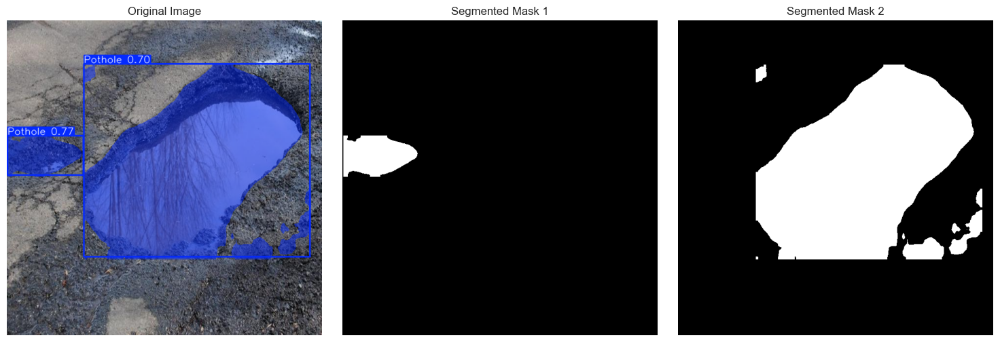

In [44]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select a sample image
selected_image = image_files[45]

# Perform inference on the selected image
image_path = os.path.join(valid_images_path, selected_image)
results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
annotated_image = results[0].plot()
annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

# Determine the number of subplots needed (1 original + number of masks)
num_subplots = 1 + (len(results[0].masks.data) if results[0].masks is not None else 0)

# Initialize the subplot with 1 row and n columns
fig, axes = plt.subplots(1, num_subplots, figsize=(15, 5))

# Display the original annotated image
axes[0].imshow(annotated_image_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

# If multiple masks, iterate and display each mask
if results[0].masks is not None:
    masks = results[0].masks.data.cpu().numpy()
    for i, mask in enumerate(masks):
        # Threshold the mask to make sure it's binary
        # Any value greater than 0 is set to 255, else it remains 0
        binary_mask = (mask > 0).astype(np.uint8) * 255
        axes[i+1].imshow(binary_mask, cmap='gray')
        axes[i+1].set_title(f'Segmented Mask {i+1}')
        axes[i+1].axis('off')

# Adjust layout and display the subplot
plt.tight_layout()
plt.show()

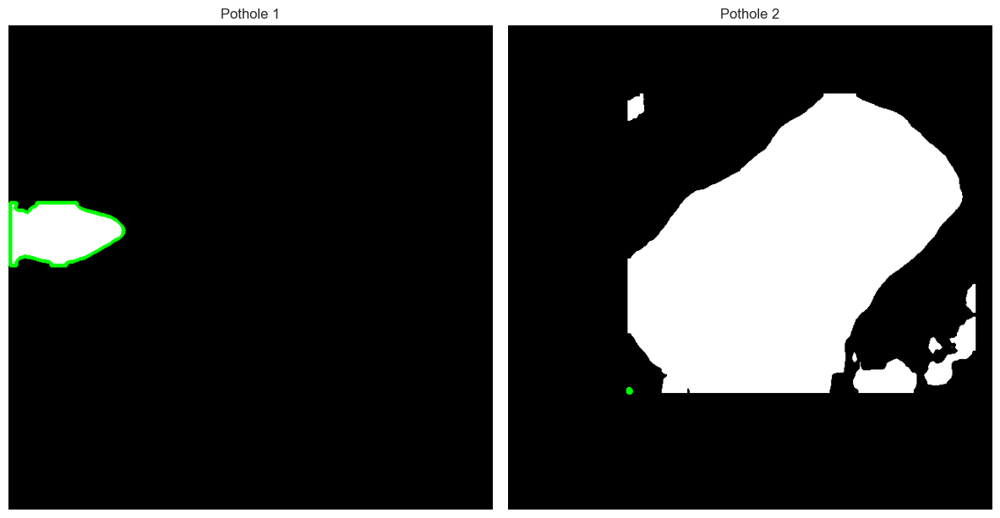

Area of Pothole 1: 9358.0 pixels
Area of Pothole 2: 19.5 pixels
--------------------------------------------------
Total Damaged Area by Potholes: 9377.5 pixels
Total Pixels in Image: 409600 pixels
Percentage of Road Damaged: 2.29%


In [45]:
# Initialize variables to hold total area and individual areas
total_area = 0
area_list = []

# Set up the subplot for displaying masks
fig, axes = plt.subplots(1, len(masks), figsize=(12, 8))

# Perform operations if masks are available
if results[0].masks is not None:
    masks = results[0].masks.data.cpu().numpy()   # Retrieve masks as numpy arrays
    image_area = masks.shape[1] * masks.shape[2]  # Calculate total number of pixels in the image
    for i, mask in enumerate(masks):
        binary_mask = (mask > 0).astype(np.uint8) * 255  # Convert mask to binary
        color_mask = cv2.cvtColor(binary_mask, cv2.COLOR_GRAY2BGR)  # Convert binary mask to color
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)  # Find contours in the binary mask
        contour = contours[0]  # Retrieve the first contour
        area = cv2.contourArea(contour)  # Calculate the area of the pothole
        area_list.append(area)  # Append area to the list
        cv2.drawContours(color_mask, [contour], -1, (0, 255, 0), 3)  # Draw the contour on the mask

        # Display the mask with the green contour
        axes[i].imshow(color_mask)
        axes[i].set_title(f'Pothole {i+1}')
        axes[i].axis('off')

# Display all masks
plt.tight_layout()
plt.show()

# Calculate and print areas after displaying the images
for i, area in enumerate(area_list):
    print(f"Area of Pothole {i+1}: {area} pixels")  
    total_area += area  # Sum the areas for total

# Calculate and print the total damaged area and percentage of road damaged by potholes
print("-"*50)
print(f"Total Damaged Area by Potholes: {total_area} pixels")
print(f"Total Pixels in Image: {image_area} pixels")
print(f"Percentage of Road Damaged: {(total_area / image_area) * 100:.2f}%")

In [46]:
# Define the video path
video_path = '/kaggle/working/sample_video.mp4'

# Define font, scale, colors, and position for the annotation
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
text_position = (40, 80)
font_color = (255, 255, 255)    # White color for text
background_color = (0, 0, 255)  # Red background for text

# Initialize a deque with fixed length for averaging the last 10 percentage damages
damage_deque = deque(maxlen=10)

# Open the video
cap = cv2.VideoCapture(video_path)

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('road_damage_assessment.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

# Read until video is completed
while cap.isOpened():
     # Capture frame-by-frame
    ret, frame = cap.read()
    if ret:
        # Perform inference on the frame
        results = best_model.predict(source=frame, imgsz=640, conf=0.25)
        processed_frame = results[0].plot(boxes=False)
        
        # Initializes percentage_damage to 0
        percentage_damage = 0 
        
        # If masks are available, calculate total damage area and percentage
        if results[0].masks is not None:
            total_area = 0
            masks = results[0].masks.data.cpu().numpy()
            image_area = frame.shape[0] * frame.shape[1]  # total number of pixels in the image
            for mask in masks:
                binary_mask = (mask > 0).astype(np.uint8) * 255
                contour, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                total_area += cv2.contourArea(contour[0])
            
            percentage_damage = (total_area / image_area) * 100

        # Calculate and update the percentage damage
        damage_deque.append(percentage_damage)
        smoothed_percentage_damage = sum(damage_deque) / len(damage_deque)
            
        # Draw a thick line for text background
        cv2.line(processed_frame, (text_position[0], text_position[1] - 10),
                 (text_position[0] + 350, text_position[1] - 10), background_color, 40)
        
        # Annotate the frame with the percentage of damage
        cv2.putText(processed_frame, f'Road Damage: {smoothed_percentage_damage:.2f}%', text_position, font, font_scale, font_color, 2, cv2.LINE_AA)         
    
        # Write the processed frame to the output video
        out.write(processed_frame)
        
        # Uncomment the following 3 lines if running this code on a local machine to view the real-time processing results
        # cv2.imshow('Road Damage Assessment', processed_frame) # Display the processed frame
        # if cv2.waitKey(1) & 0xFF == ord('q'): # Press Q on keyboard to exit the loop
        #     break 
    else:
        break

# Release the video capture and video write objects
cap.release()
out.release()

# Close all the frames
# cv2.destroyAllWindows()

In [47]:
# Convert the .avi video generated by our traffic density estimation app to .mp4 format for compatibility with notebook display
!ffmpeg -y -loglevel panic -i /kaggle/working/road_damage_assessment.avi road_damage_assessment.mp4

# Embed and display the processed sample video within the notebook
Video("road_damage_assessment.mp4", embed=True, width=960)

'ffmpeg' is not recognized as an internal or external command,
operable program or batch file.
